# Notebook pour les essais de clustering

## Objectifs

- Réaliser une segmentation des clients
- Comprendre les différents types d’utilisateurs
- Fournir à l’équipe marketing une description actionable de votre segmentation
- Regrouper des clients de profils similaires
- Réaliser un premier clustering
- Faire une segmentation qui doit être exploitable et facile d’utilisation par notre équipe Marketing
- Pouvoir différencier au minimum les bons et moins bons clients en termes de commandes et de satisfaction
- Faire une segmentation sur l’ensemble des clients

## Import des librairies et formules

### Librairies

In [113]:
import pandas as pd
import numpy as np

import matplotlib.pyplot as plt
import seaborn as sns
sns.color_palette("bright")
import plotly.express as px
import plotly.graph_objects as go

import datetime as dt

from matplotlib.collections import LineCollection

from scipy.cluster.hierarchy import dendrogram

from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import explained_variance_score
import sklearn.neighbors

from mlxtend.plotting import plot_pca_correlation_graph
from mlxtend.feature_extraction import PrincipalComponentAnalysis

### Formules

In [114]:
def display_factorial_planes(   X_projected, 
                                x_y, 
                                pca=None, 
                                labels = None,
                                clusters=None, 
                                alpha=1,
                                figsize=[7,7], 
                                marker="." ):
    """
    Affiche la projection des individus

    Positional arguments : 
    -------------------------------------
    X_projected : np.array, pd.DataFrame, list of list : la matrice des points projetés
    x_y : list ou tuple : le couple x,y des plans à afficher, exemple [0,1] pour F1, F2

    Optional arguments : 
    -------------------------------------
    pca : sklearn.decomposition.PCA : un objet PCA qui a été fit, cela nous permettra d'afficher la variance de chaque composante, default = None
    labels : list ou tuple : les labels des individus à projeter, default = None
    clusters : list ou tuple : la liste des clusters auquel appartient chaque individu, default = None
    alpha : float in [0,1] : paramètre de transparence, 0=100% transparent, 1=0% transparent, default = 1
    figsize : list ou tuple : couple width, height qui définit la taille de la figure en inches, default = [10,8] 
    marker : str : le type de marker utilisé pour représenter les individus, points croix etc etc, default = "."
    """

    # Transforme X_projected en np.array
    X_ = np.array(X_projected)

    # On définit la forme de la figure si elle n'a pas été donnée
    if not figsize: 
        figsize = (7,6)

    # On gère les labels
    if  labels is None : 
        labels = []
    try : 
        len(labels)
    except Exception as e : 
        raise e

    # On vérifie la variable axis 
    if not len(x_y) ==2 : 
        raise AttributeError("2 axes sont demandées")   
    if max(x_y )>= X_.shape[1] : 
        raise AttributeError("la variable axis n'est pas bonne")   

    # on définit x et y 
    x, y = x_y

    # Initialisation de la figure       
    fig, ax = plt.subplots(1, 1, figsize=figsize)

    # On vérifie s'il y a des clusters ou non
    c = None if clusters is None else clusters
 
    # Les points    
    plt.scatter(   X_[:, x], 
                        X_[:, y], 
                        alpha=alpha, 
                        c=c, 
                        cmap="Set1", 
                        marker=marker)


    # Si la variable pca a été fournie, on peut calculer le % de variance de chaque axe 
    if pca : 
        v1 = str(round(100*pca.explained_variance_ratio_[x]))  + " %"
        v2 = str(round(100*pca.explained_variance_ratio_[y]))  + " %"
    else : 
        v1=v2= ''

    # Nom des axes, avec le pourcentage d'inertie expliqué
    ax.set_xlabel(f'F{x+1} {v1}')
    ax.set_ylabel(f'F{y+1} {v2}')

    # Valeur x max et y max
    x_max = np.abs(X_[:, x]).max() *1.1
    y_max = np.abs(X_[:, y]).max() *1.1

    # On borne x et y 
    ax.set_xlim(left=-x_max, right=x_max)
    ax.set_ylim(bottom= -y_max, top=y_max)

    # Affichage des lignes horizontales et verticales
    plt.plot([-x_max, x_max], [0, 0], color='grey', alpha=0.8)
    plt.plot([0,0], [-y_max, y_max], color='grey', alpha=0.8)

    # Affichage des labels des points
    if len(labels) : 
        # j'ai copié collé la fonction sans la lire
        for i,(_x,_y) in enumerate(X_[:,[x,y]]):
            plt.text(_x, _y+0.05, labels[i], fontsize='14', ha='center',va='center') 

    # Titre et display
    plt.title(f"Projection des individus (sur F{x+1} et F{y+1})")
    plt.show()



In [115]:
def ACP (df):
    """
    Fonction qui prend un df en entrée, effectue un standard scaling, réalise une ACP, et affiche :
    - le graphe des eboulis des valeurs propres
    - une heatmap de contribution des features pour chaque composante principale
    - le cercle des corrélation
    - le graphe des individus sur le premier plan factoriel
    
    !!! La fonction prend un dataframe avec des features uniquement numériques en entrée !!!    
    """
    X = df.values # tranforme le dataframe en array numpy
    features = df.columns # stocke les noms des colonnes
    
    # application du standard scaling
    from sklearn.preprocessing import StandardScaler    
    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(X)
    
    # application de la PCA
    from sklearn.decomposition import PCA
    n_components = len(features)
    pca = PCA(n_components=n_components)
    pca.fit_transform(X_scaled)
                
    # mise en place de la figure avec 4 subplots
    fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2, figsize=(15, 10))
    fig.subplots_adjust(wspace=0.4,hspace=0.4)
    fig.suptitle('PCA')
    
    # valeurs pour le graphe des eboulis des valeurs propres 'ax1'
    scree = (pca.explained_variance_ratio_*100).round(2)
    scree_cum = scree.cumsum().round()
    x_list = range(1, n_components+1)
    
    ax1.bar(x_list, scree)
    ax1.plot(x_list, scree_cum,c="red",marker='o')
    ax1.plot(x_list, scree_cum,c="red",marker='o')
    ax1.set_title('Eboulis des valeurs propres')
    ax1.set_xlabel("rang de l'axe d'inertie")
    ax1.set_ylabel("pourcentage d'inertie")
    
    # valeurs pour la heatmap de contribution des features pour chaque composante principale 'ax2'
    pcs = pd.DataFrame(pca.components_)
    pcs.columns = features
    pcs.index = [f"F{i}" for i in x_list]
    pcs.round(2)
    sns.heatmap(pcs.T, vmin=-1, vmax=1, annot=True, cmap="coolwarm", fmt="0.1f", ax=ax2)
    
    # valeurs pour le cercle de corrélation 'ax3'
    x, y = 0,1
    for i in range(0, pca.components_.shape[1]):
        # On trace les flèches
        ax3.arrow(0,0,pca.components_[x, i],pca.components_[y, i],
                  head_width=0.07,head_length=0.07,width=0.02)

        # On met le texte sur chaque pointe de flèche
        ax3.text(pca.components_[x, i] + 0.05,
                 pca.components_[y, i] + 0.05,
                 features[i])

    # On affichage des lignes horizontales et verticales
    ax3.plot([-1, 1], [0, 0], color='grey', ls='--')
    ax3.plot([0, 0], [-1, 1], color='grey', ls='--')

    # On affiche le nom des axes, avec le pourcentage d'inertie expliqué
    ax3.set_xlabel('F{} ({}%)'.format(x+1, round(100*pca.explained_variance_ratio_[x],1)))
    ax3.set_ylabel('F{} ({}%)'.format(y+1, round(100*pca.explained_variance_ratio_[y],1)))

    ax3.set_title("Cercle des corrélations (F{} et F{})".format(x+1, y+1))

    an = np.linspace(0, 2 * np.pi, 100)
    # On trace le cercle
    ax3.plot(np.cos(an), np.sin(an))  
    ax3.axis('equal')
    
    
    # valeurs pour le graphe des individus sur le premier plan factoriel 'ax4'
    X_proj = pca.transform(X_scaled)
    x, y = [0,1]
    
    # Transforme X_projected en np.array
    X_ = np.array(X_proj)

    # Les points    
    ax4.scatter(X_[:, x],X_[:, y],marker='o')

    # Nom des axes
    ax4.set_xlabel(f'F{x+1} {""}')
    ax4.set_ylabel(f'F{y+1} {""}')

    # Valeur x max et y max
    x_max = np.abs(X_[:, x]).max() *1.1
    y_max = np.abs(X_[:, y]).max() *1.1

    # On borne x et y 
    ax4.set_xlim(left=-x_max, right=x_max)
    ax4.set_ylim(bottom= -y_max, top=y_max)

    # Affichage des lignes horizontales et verticales
    ax4.plot([-x_max, x_max], [0, 0], color='grey', alpha=0.8)
    ax4.plot([0,0], [-y_max, y_max], color='grey', alpha=0.8)

    # Titre
    ax4.set_title(f"Projection des individus (sur F{x+1} et F{y+1})")   

In [116]:
def k_means_scoring (df):
    from sklearn.preprocessing import StandardScaler
    scaler = StandardScaler()
    RFM_scaled = scaler.fit_transform(df.values)
    
    from sklearn.cluster import KMeans
    from sklearn.metrics import silhouette_score
    score = []
    for i in range(2, 11): 
        kmeans_s = KMeans(n_clusters = i, init = 'k-means++',n_init=10, random_state=0) 
        kmeans_s.fit(RFM_scaled)
        score.append(silhouette_score(RFM_scaled, kmeans_s.labels_, metric='euclidean'))
    
    wcss = []
    for i in range(2, 11): 
        kmeans_i = KMeans(n_clusters = i, init = 'k-means++',n_init=10, random_state=0) 
        kmeans_i.fit(RFM_scaled) 
        wcss.append( kmeans_i.inertia_)
    
    plt.figure(figsize=(10,3))
    plt.subplots_adjust(wspace=0.4,hspace=0.4)
    plt.subplot(121)
    plt.suptitle("K-Means",y=1.1)
    plt.plot(range(2, 11), score)
    plt.title("Score de silhouette vs nombre de cluster")
    plt.xlabel("nb cluster")
    plt.ylabel("score silhouette")
    plt.subplot(122)
    plt.xlabel('nb cluster')
    plt.ylabel('inertie (WCSS)')
    plt.title('Inertie (WCSS) vs nombre de cluster')
    plt.plot(range(2, 11), wcss)

In [117]:
def agglo_clustering_scoring (df):
    from sklearn.preprocessing import StandardScaler
    scaler = StandardScaler()
    RFM_scaled = scaler.fit_transform(df.values)
    
    from sklearn.cluster import AgglomerativeClustering
    from sklearn.metrics import silhouette_score
    score = []
    for i in range(2, 11): 
        agglo_s = AgglomerativeClustering(n_clusters = i) 
        agglo_s.fit(RFM_scaled)
        score.append(silhouette_score(RFM_scaled, agglo_s.labels_, metric='euclidean'))
    
    from sklearn.metrics.cluster import adjusted_rand_score
        
    plt.figure(figsize=(5,3))
    plt.plot(range(2, 11), score)
    plt.title("Score de silhouette vs nombre de cluster pour agglomerative clustering")
    plt.xlabel("nb cluster")
    plt.ylabel("score silhouette")

In [118]:
def dbscan_scoring (df):
    from sklearn.preprocessing import StandardScaler
    scaler = StandardScaler()
    RFM_scaled = scaler.fit_transform(df.values)
    
    from sklearn.cluster import DBSCAN
    from sklearn.metrics import silhouette_score
    score = []
    nb_cluster = []
    for i in range(1, 21): 
        dbscan_s = DBSCAN(eps=(i/10), n_jobs = 7) 
        dbscan_s.fit(RFM_scaled)
        score.append(silhouette_score(RFM_scaled, dbscan_s.labels_, metric='euclidean'))
        nb_cluster.append(pd.Series(dbscan_s.labels_).nunique())
    
    plt.figure(figsize=(10,3))
    plt.subplots_adjust(wspace=0.4,hspace=0.4)
    plt.subplot(121)
    plt.suptitle("DBScan",y=1.1)
    plt.plot(np.arange(0.1,2.1,0.1), score)
    plt.title("Score de silhouette vs eps")
    plt.xlabel("eps")
    plt.ylabel("score silhouette")
    plt.subplot(122)
    plt.plot(np.arange(0.1,2.1,0.1), nb_cluster)
    plt.title("Nombre de cluster vs eps")
    plt.xlabel("eps")
    plt.ylabel("nb cluster")
    plt.ylim(0,11)

In [119]:
def t_SNE (df):
    from sklearn.preprocessing import StandardScaler
    from sklearn import manifold
    scaler = StandardScaler()
    X = df.values
    X_scaled = scaler.fit_transform(X)
    tsne = manifold.TSNE(n_components=2, perplexity=30, n_iter=500, init='pca', n_jobs=7,random_state=42)
    X_tsne = pd.DataFrame(tsne.fit_transform(X_scaled))
    return X_tsne

In [120]:
def t_SNE_graph (df_tsne,color=None):
    X_tsne = df_tsne.copy()
    color_tsne = color
    if color is not None:
        color_tsne = color.copy()
        X_tsne['color'] = color_tsne.values
        X_tsne = X_tsne.sort_values('color')
        color_tsne = X_tsne['color']
        X_tsne = X_tsne.drop('color',axis=1)
    fig = px.scatter(X_tsne, x=0, y=1, title="t-SNE",color=color_tsne)
    fig.update_layout(width=600)
    fig.update_traces(marker_size=4)
    fig.show()

In [121]:
def nb_individus_cluster (df,nb_cluster=2) :
    from sklearn.preprocessing import StandardScaler
    scaler = StandardScaler()
    df_scaled = scaler.fit_transform(df.values)
    
    from sklearn.cluster import KMeans
    kmeans = KMeans(n_clusters = nb_cluster, init = 'k-means++',n_init=10, random_state=0)
    kmeans.fit(df_scaled) 
    df_cluster = df.copy()
    df_cluster['label'] = kmeans.labels_
    print(df_cluster.groupby('label').count().iloc[:,:1])
    
    from sklearn.metrics.cluster import adjusted_rand_score
    kmeans1 = KMeans(n_clusters = nb_cluster, init = 'k-means++',n_init=10, random_state=0)
    kmeans2 = KMeans(n_clusters = nb_cluster, init = 'k-means++',n_init=10, random_state=0)
    kmeans1.fit(pd.DataFrame(df_scaled).sample(frac = 0.3))
    kmeans2.fit(df_scaled)
    print('ARI score : ',adjusted_rand_score(kmeans2.labels_,kmeans1.predict(df_scaled)))

In [122]:
def nb_individus_cluster_AC (df,nb_cluster=2) :
    from sklearn.preprocessing import StandardScaler
    scaler = StandardScaler()
    df_scaled = scaler.fit_transform(df.values)
    
    from sklearn.cluster import AgglomerativeClustering
    agglo = AgglomerativeClustering(n_clusters = nb_cluster)
    agglo.fit(df_scaled) 
    df_cluster = df.copy()
    df_cluster['label'] = agglo.labels_
    print(df_cluster.groupby('label').count())

In [123]:
def nb_individus_cluster_DBScan (df,eps=0.5) :
    from sklearn.preprocessing import StandardScaler
    scaler = StandardScaler()
    df_scaled = scaler.fit_transform(df.values)
    
    from sklearn.cluster import DBSCAN
    dbscan = DBSCAN(eps = eps, n_jobs = 7)
    dbscan.fit(df_scaled) 
    df_cluster = df.copy()
    df_cluster['label'] = dbscan.labels_
    print(df_cluster['label'].nunique())
    print(df_cluster.groupby('label').count())

In [124]:
def label_cluster (df,nb_cluster=2) :
    from sklearn.preprocessing import StandardScaler
    scaler = StandardScaler()
    df_scaled = scaler.fit_transform(df.values)
    
    from sklearn.cluster import KMeans
    kmeans = KMeans(n_clusters = nb_cluster, init = 'k-means++',n_init=10, random_state=0)
    kmeans.fit(df_scaled) 
    labels = pd.Series(kmeans.labels_).astype('object')
    return labels

In [125]:
def label_cluster_AC (df,nb_cluster=2) :
    from sklearn.preprocessing import StandardScaler
    scaler = StandardScaler()
    df_scaled = scaler.fit_transform(df.values)
    
    from sklearn.cluster import AgglomerativeClustering
    agglo = AgglomerativeClustering(n_clusters = nb_cluster)
    agglo.fit(df_scaled) 
    labels = pd.Series(agglo.labels_).astype('object')
    return labels

In [126]:
def label_cluster_DBScan (df,eps=0.5) :
    from sklearn.preprocessing import StandardScaler
    scaler = StandardScaler()
    df_scaled = scaler.fit_transform(df.values)
    
    from sklearn.cluster import DBSCAN
    dbscan = DBSCAN(eps = eps, n_jobs = 7)
    dbscan.fit(df_scaled) 
    labels = pd.Series(dbscan.labels_).astype('object')
    return labels

In [127]:
def RFM_3D_matplotlib (df,colors=None) : 
    if colors is not None:
        df['color'] = colors.values
        df = df.sort_values('color')
        colors = df['color']
        df = df.drop('color',axis=1)
        
    fig = plt.figure()

    ax = fig.add_subplot(projection='3d')

    ax.scatter((df['recence']), (df['frequence']), (df['montant']),c=colors)
    ax.view_init(elev=10, azim=15)

    ax.set_xlabel('recence')
    ax.set_ylabel('frequence')
    ax.set_zlabel('montant')
    ax.set_title('RFM vue 3D')

    plt.show()

In [128]:
def RFM_3D_plotly (df,colors=None) :
    df_RFM = df.copy()
    import plotly.express as px
    colors_RFM = colors
    if colors is not None :
        colors_RFM = colors.copy()
        df_RFM['colors'] = colors_RFM.values
        df_RFM = df_RFM.sort_values('colors')
        colors_RFM = df_RFM['colors']
    
    fig = px.scatter_3d(df_RFM, x='recence', y='frequence', z='montant',color=colors_RFM, title='RFM vue 3D')
    fig.update_layout(width=800,height=800)
    fig.update_traces(marker_size=5)
    fig.show()

In [129]:
def feature_repartition (df,labels):
    df_clust = df.copy()
    for i in df_clust.columns.unique():
        df_clust[i] = (df_clust[i]-df_clust[i].min())/(df_clust[i].max()-df_clust[i].min())
    df_clust['labels'] = labels.values
    df_clust = df_clust.sort_values('labels')
    fig = go.Figure()
    for i in df_clust['labels'].unique() :
        df_clust_i = df_clust.loc[df_clust['labels']==i].drop('labels',axis=1).stack().reset_index().groupby('level_1').agg(mean = (0,"mean")).reset_index()
        fig.add_trace(go.Scatterpolar(r=df_clust_i['mean'],theta=df_clust_i['level_1'],fill='toself',name=f'Cluster {i}'))
    fig.update_layout(polar=dict(radialaxis=dict(visible=True,range=[0, 1])),showlegend=True)
    fig.show()

## Import des fichiers de l'exploration

In [130]:
df_client = pd.read_csv('df_client.csv')
df_full = pd.read_csv('df_full.csv')
df_full.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 90995 entries, 0 to 90994
Data columns (total 43 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   order_id                       90995 non-null  object 
 1   nb_order_item                  90995 non-null  int64  
 2   product_id                     90995 non-null  object 
 3   seller_id                      90995 non-null  object 
 4   shipping_limit_date            90995 non-null  object 
 5   total_order_price              90995 non-null  float64
 6   total_order_freight_value      90995 non-null  float64
 7   payment_type                   90995 non-null  object 
 8   payment_installments           90995 non-null  float64
 9   payment_value                  90995 non-null  float64
 10  review_id                      90995 non-null  object 
 11  review_score                   90995 non-null  float64
 12  review_answer_timestamp        90995 non-null 

## Analyse avec Kmeans mais sans feature engineering

### ACP

In [131]:
df_full_num = df_full.select_dtypes(exclude='object').select_dtypes(exclude='datetime64').sample(n=10000,random_state=42)

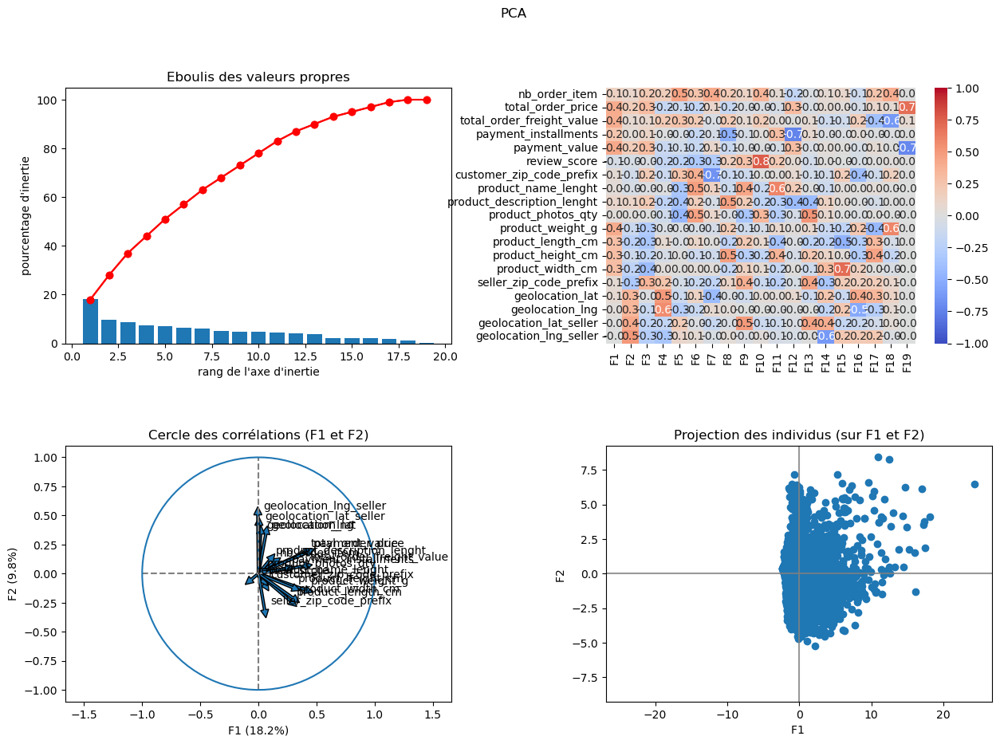

In [132]:
ACP(df_full_num)

Il n'y a pas de feature qui ressort franchement du lot. On peut essayer de prendre les plus représentatives du premier plan factoriel F1 F2, par contre je ne sais pas comment interpréter d'un point de vue client le poids des produits et la localisation des vendeurs

### ACP avec les features du premier plan factoriel

In [133]:
df_full_num = df_full[['total_order_price','total_order_freight_value','payment_value','product_weight_g','geolocation_lng_seller','geolocation_lat_seller']].sample(n=10000,random_state=42)

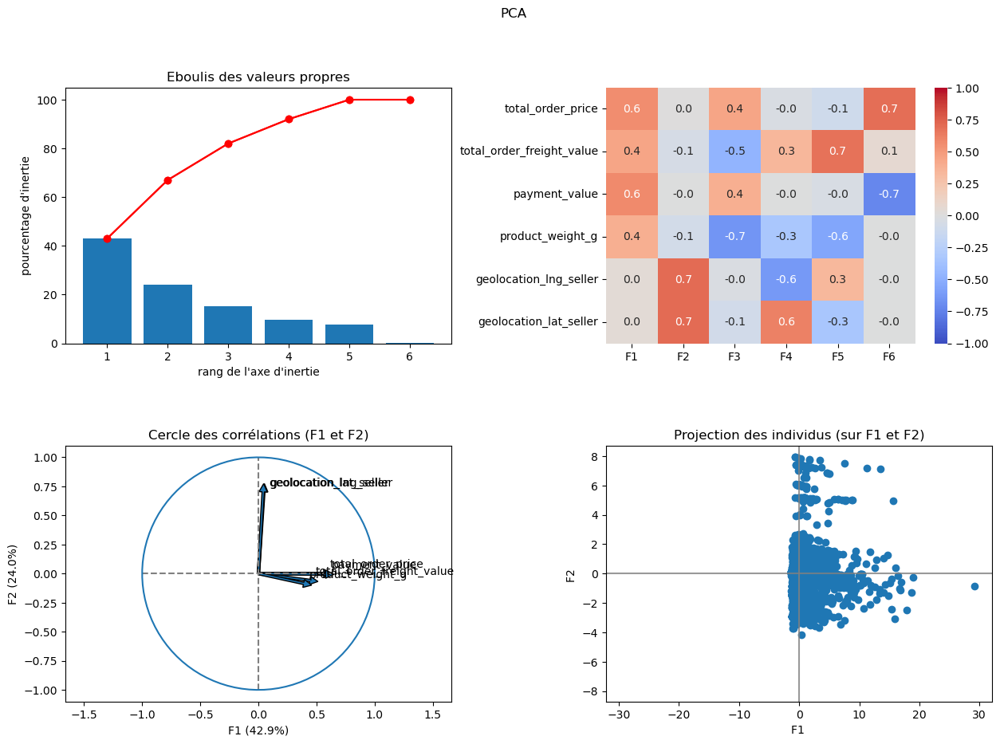

In [134]:
ACP(df_full_num)

On voit sur le cercle de corrélation que les features sont corrélées entre elles, ce qui est normal.

### t-SNE

In [135]:
T_SNE_full = t_SNE(df_full_num)

### K Means

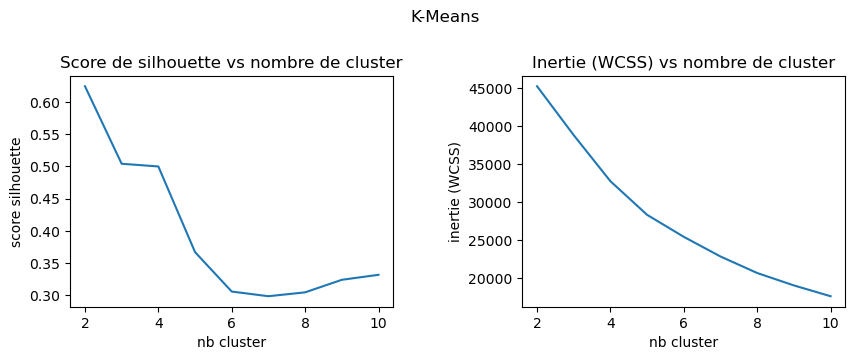

In [136]:
k_means_scoring(df_full_num)

On distingue à peine le coude, mais il semble être sur 5 clusters

In [137]:
nb_individus_cluster(df_full_num,nb_cluster=5)

       total_order_price
label                   
0                   7250
1                   1526
2                    162
3                    147
4                    915
ARI score :  0.926419149674129


La stabilité est bonne, par contre certains clusters sont trop petits

In [138]:
labels_full = label_cluster(df_full_num,nb_cluster=5)

In [139]:
t_SNE_graph(T_SNE_full,color=labels_full)

On voit également ici que les groupes sont disproportionnés.

## Analyse avec Kmeans et avec les 3 features RFM

### ACP

In [140]:
df_RFM = df_client[['recence','frequence','montant']].sample(n=10000,random_state=42)

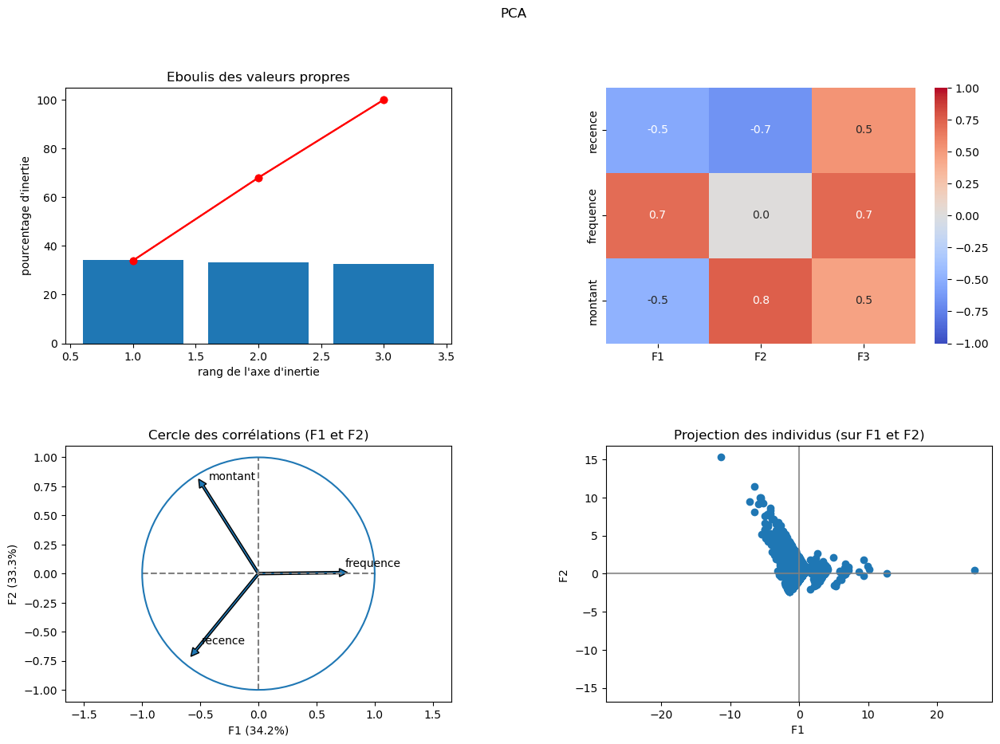

In [141]:
ACP(df_RFM)

Les trois features sont très bien équilibrées, il n'y a pas du tout de corrélation entre elles

### t-SNE

In [142]:
t_SNE_RFM = t_SNE(df_RFM)

### K Means

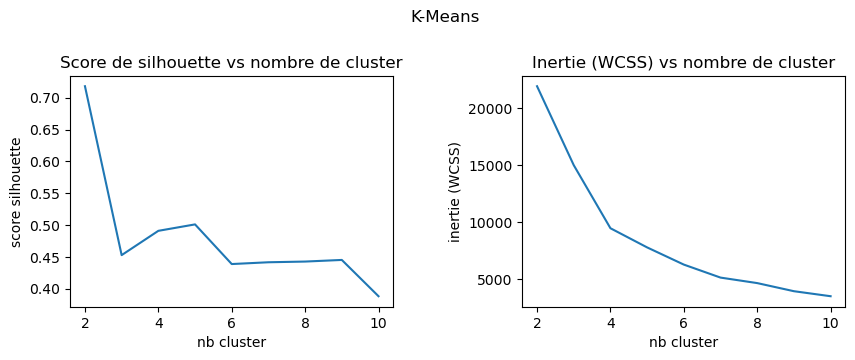

In [143]:
k_means_scoring(df_RFM)

On voit très nettement le coude à 4 clusters.

In [144]:
nb_individus_cluster(df_RFM,nb_cluster=4)

       recence
label         
0         5378
1          313
2          333
3         3976
ARI score :  0.9649128146576917


Le score ARI est très bon, par contre il y a deux clusters de tailles plutot faibles

In [145]:
labels_RFM = label_cluster(df_RFM,nb_cluster=4)

In [146]:
t_SNE_graph(t_SNE_RFM,color=labels_RFM)

Le t-SNE est très net, les frontières entre chaque cluster sont nettes également

In [147]:
RFM_3D_plotly(df_RFM,colors=labels_RFM)

On comprend mieux la taille des clusters sur cette vue 3D. Il y a moins d'individus sur les clusters à fréquence haute et à montant haut

### Contribution des features aux clusters

In [148]:
feature_repartition(df_RFM,labels_RFM)

La répartition sur un radar plot n'est pas très lisible.

<AxesSubplot: xlabel='labels', ylabel='montant'>

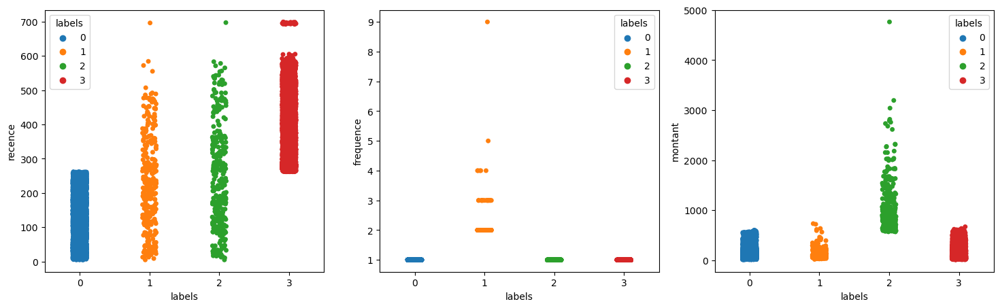

In [149]:
df_RFM_clust = df_RFM.copy()
df_RFM_clust['labels'] = labels_RFM.values
fig, axes = plt.subplots(1, 3, figsize=(18, 5))
sns.stripplot(ax=axes[0],data=df_RFM_clust, x="labels", y="recence",hue="labels", palette="tab10")
sns.stripplot(ax=axes[1],data=df_RFM_clust, x="labels", y="frequence",hue="labels", palette="tab10")
sns.stripplot(ax=axes[2],data=df_RFM_clust, x="labels", y="montant",hue="labels", palette="tab10")

On comprend nettement les clusters ici, comme sur la vue 3D

##  Analyse avec Agglomerative Clustering et avec les 3 features RFM

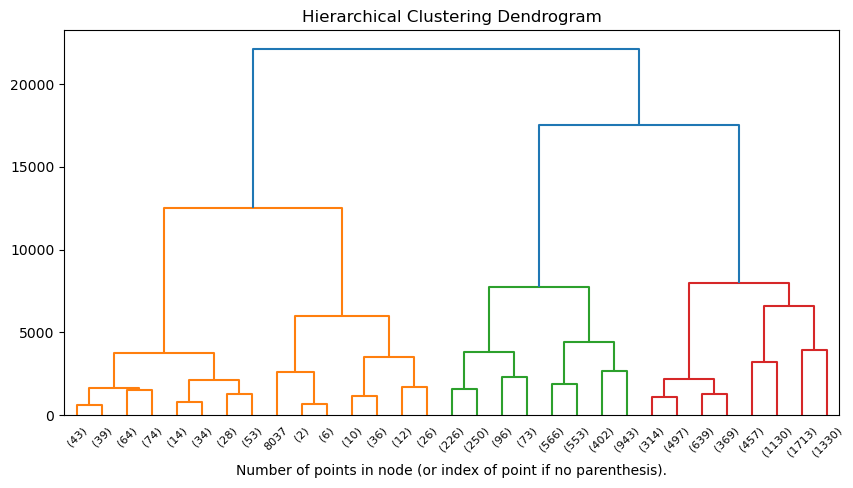

In [150]:
from sklearn.cluster import AgglomerativeClustering

def plot_dendrogram(model, **kwargs):
    # Create linkage matrix and then plot the dendrogram

    # create the counts of samples under each node
    counts = np.zeros(model.children_.shape[0])
    n_samples = len(model.labels_)
    for i, merge in enumerate(model.children_):
        current_count = 0
        for child_idx in merge:
            if child_idx < n_samples:
                current_count += 1  # leaf node
            else:
                current_count += counts[child_idx - n_samples]
        counts[i] = current_count

    linkage_matrix = np.column_stack(
        [model.children_, model.distances_, counts]
    ).astype(float)

    # Plot the corresponding dendrogram
    dendrogram(linkage_matrix, **kwargs)


# setting distance_threshold=0 ensures we compute the full tree.
model = AgglomerativeClustering(distance_threshold=0, n_clusters=None)

model = model.fit(df_RFM)
plt.figure(figsize=(10,5))
plt.title("Hierarchical Clustering Dendrogram")
# plot the top three levels of the dendrogram
plot_dendrogram(model, truncate_mode="level", p=4)
plt.xlabel("Number of points in node (or index of point if no parenthesis).")
plt.show()

Le dendrogram se divise bien en 4 clusters également, on peut tracer un trait à 10000

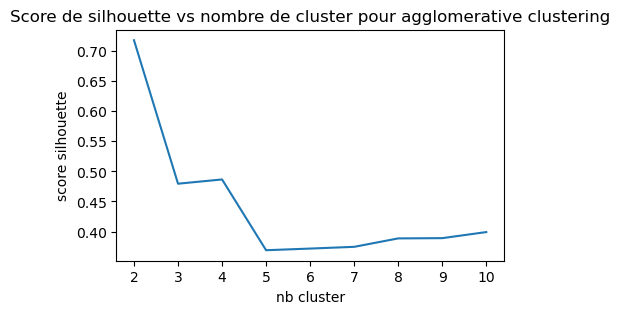

In [151]:
agglo_clustering_scoring(df_RFM)

In [152]:
nb_individus_cluster_AC(df_RFM,nb_cluster=4)

       recence  frequence  montant
label                             
0         6663       6663     6663
1          313        313      313
2          299        299      299
3         2725       2725     2725


Il y a un des deux gros clusters qui est plus gros que l'autre.

In [153]:
label_RFM_AC = label_cluster_AC(df_RFM,nb_cluster=4)

In [154]:
t_SNE_graph(t_SNE_RFM,color=label_RFM_AC)

Le t-SNE est très net également, les frontières sont nettes

In [155]:
RFM_3D_plotly(df_RFM,colors=label_RFM_AC)

On voit que la frontière entre récence faible et récence forte n'est pas franche, ainsi que sur le montant. C'est moins facilement interprétable qu'avec KMEANS

In [156]:
from sklearn.metrics.cluster import adjusted_rand_score
print('ARI entre Kmeans et CAH :',adjusted_rand_score(labels_RFM,label_RFM_AC))

ARI entre Kmeans et CAH : 0.5808892950842581


##  Analyse avec DBScan et avec les 3 features RFM

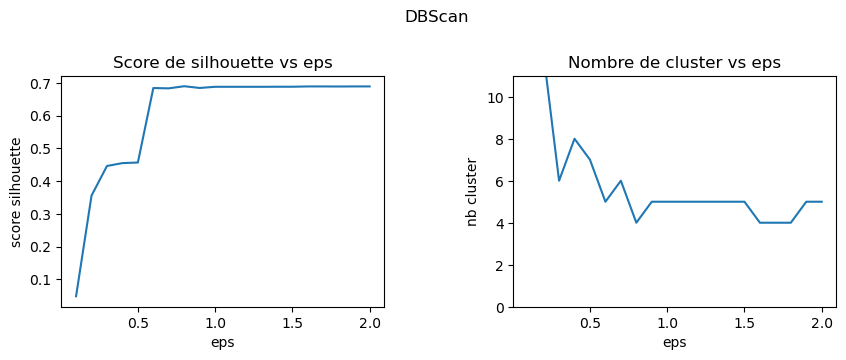

In [157]:
dbscan_scoring(df_RFM)

In [158]:
nb_individus_cluster_DBScan(df_RFM,eps=0.8)

4
       recence  frequence  montant
label                             
-1          39         39       39
 0        9667       9667     9667
 1         280        280      280
 2          14         14       14


Les clusters sont complètement disproportionnés. Ce n'est pas du tout exploitable

In [159]:
labels_DBScan = label_cluster_DBScan(df_RFM,eps=0.8)

In [160]:
t_SNE_graph(t_SNE_RFM,color=labels_DBScan)

In [161]:
RFM_3D_plotly(df_RFM,colors=labels_DBScan)

On voit que l'algorithme DBScan n'est pas du tout adapté dans ce cas là.

In [162]:
from sklearn.metrics.cluster import adjusted_rand_score
adjusted_rand_score(labels_RFM,labels_DBScan)

0.10516005931840502

## Analyse avec Kmeans et RFM, mais ajout du review score

### ACP

In [163]:
df_RFM_RS = df_client[['recence','frequence','montant','mean_review_score']].sample(n=10000,random_state=42)

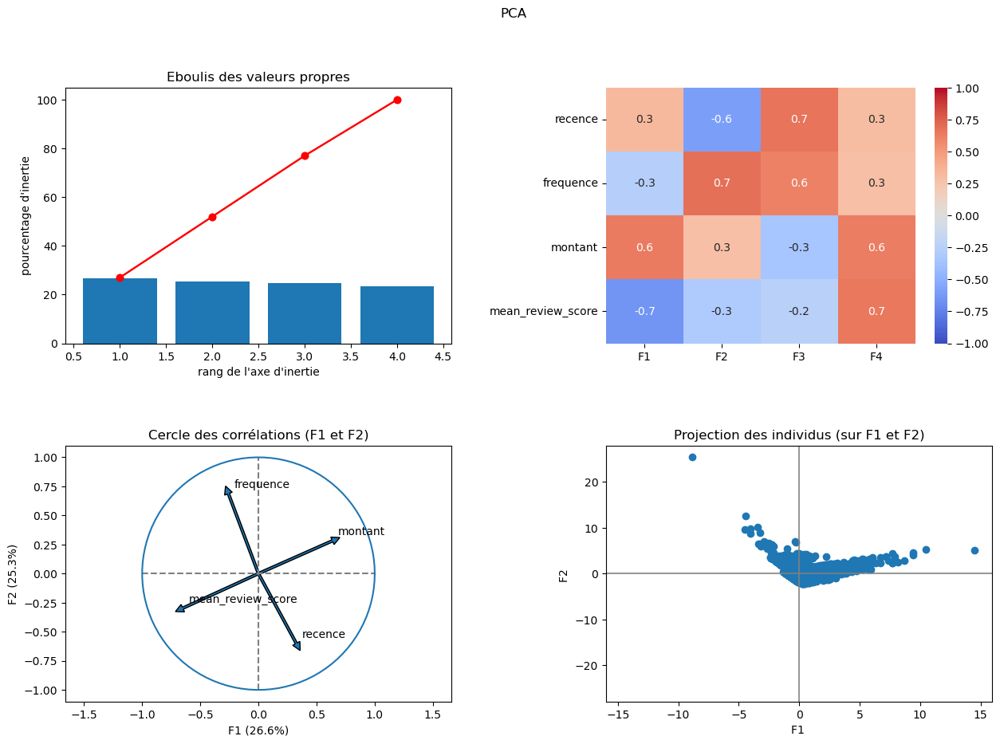

In [164]:
ACP(df_RFM_RS)

Les 4 features sont très bien réparties

### t-SNE

In [165]:
T_SNE_RFM_RS = t_SNE(df_RFM_RS)

### K Means

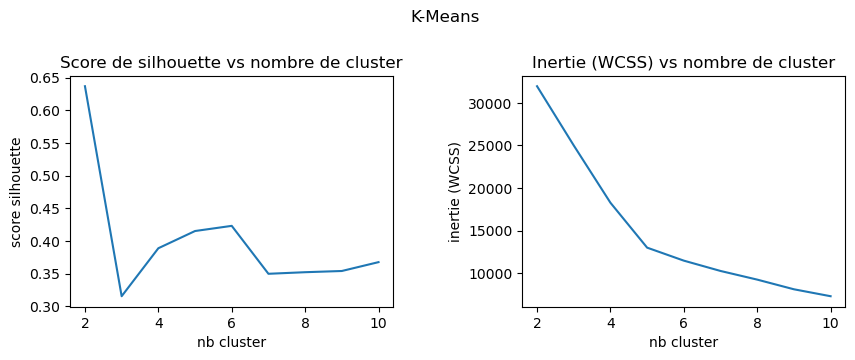

In [166]:
k_means_scoring(df_RFM_RS)

Le coude se situe à 5 clusters de manière nette

In [167]:
nb_individus_cluster(df_RFM_RS,nb_cluster=5)

       recence
label         
0         4404
1         3393
2         1637
3          313
4          253
ARI score :  0.970738045331578


Le score ARI est très bon. Il y a un cluster un peu petit quand meme

In [168]:
labels_RFM_RS = label_cluster(df_RFM_RS,nb_cluster=5)

In [169]:
t_SNE_graph(T_SNE_RFM_RS,color=labels_RFM_RS)

Le t-SNE est plutot net

In [170]:
RFM_3D_plotly(df_RFM_RS,colors=labels_RFM_RS)

On comprend ou se situe le nouveau cluster ici. Il est répartit sur les deux anciens gros clusters

### Contribution des features aux clusters

In [171]:
feature_repartition(df_RFM_RS,labels_RFM_RS)

<AxesSubplot: xlabel='labels', ylabel='mean_review_score'>

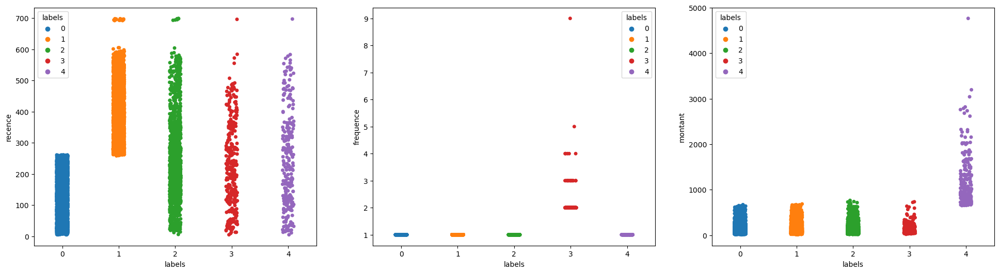

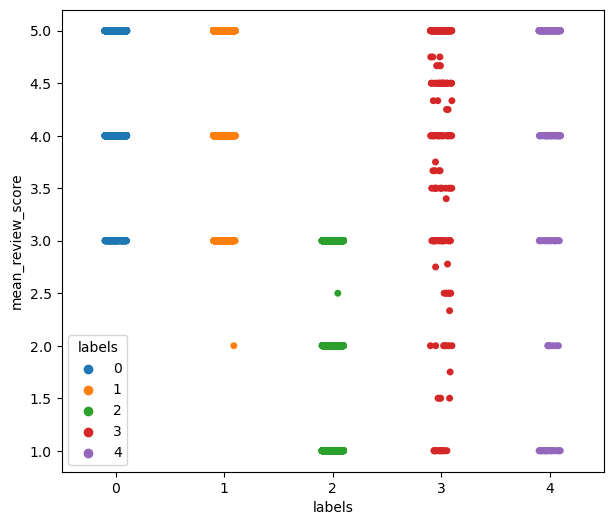

In [172]:
df_RFM_RS_clust = df_RFM_RS.copy()
df_RFM_RS_clust['labels'] = labels_RFM_RS.values
fig, axes = plt.subplots(1, 3, figsize=(24, 6))
sns.stripplot(ax=axes[0],data=df_RFM_RS_clust, x="labels", y="recence",hue="labels", palette="tab10")
sns.stripplot(ax=axes[1],data=df_RFM_RS_clust, x="labels", y="frequence",hue="labels", palette="tab10")
sns.stripplot(ax=axes[2],data=df_RFM_RS_clust, x="labels", y="montant",hue="labels", palette="tab10")
fig, axes = plt.subplots(1, 1, figsize=(7, 6))
sns.stripplot(ax=axes,data=df_RFM_RS_clust, x="labels", y='mean_review_score',hue="labels", palette="tab10")

On comprend ici que les clusters à fréquence haute et à montant élevé n'ont pas été impacté. Par contre on comprend que ce sont les individus du cluster 2 qui sont ceux qui ont mis de mauvaises notes.

## Kmeans avec RFM et review score, et on ajoute time_order_to_delivered

### ACP

In [173]:
df_3 = df_client[['recence','frequence','montant','mean_review_score','time_order_to_delivered']].sample(n=10000,random_state=42)

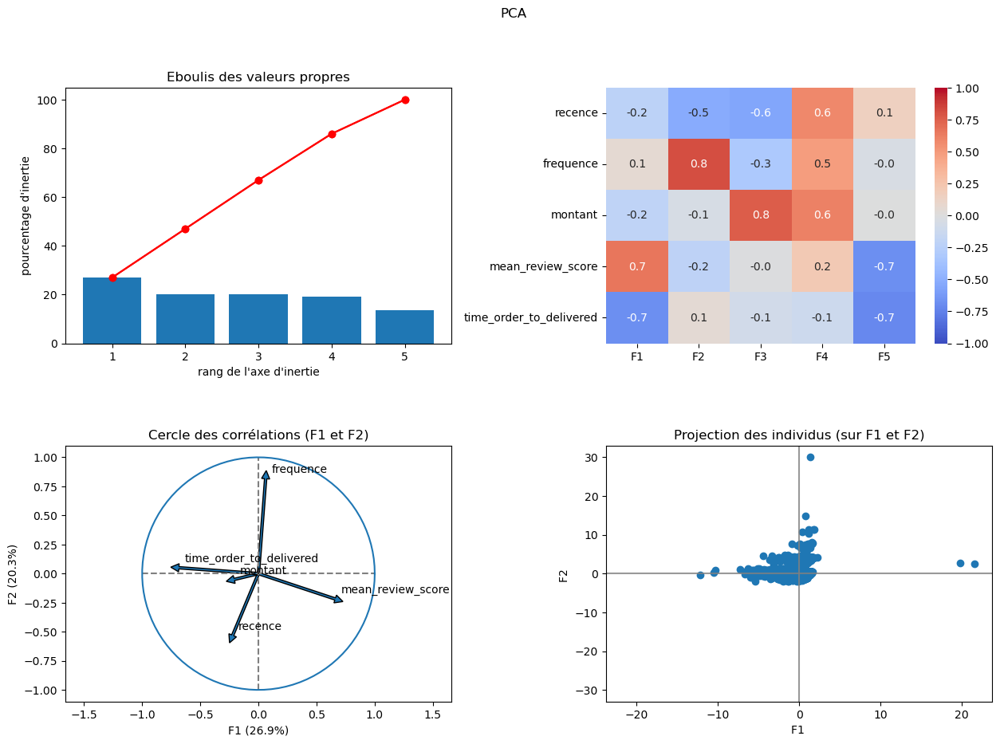

In [174]:
ACP(df_3)

On voit ici qu'il y a un moins bon équilibre au niveau des features. On dirait qu'il y a une anti-corrélation entre le review score et le délai de livraison.

### t-SNE

In [175]:
t_SNE_3 = t_SNE(df_3)

### K Means

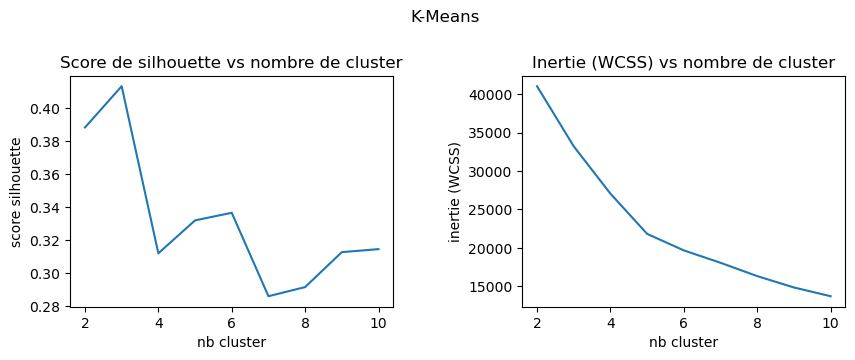

In [176]:
k_means_scoring(df_3)

Le nombre de cluster reste à 5, ce qui renforce le sentiment de lien entre review score et délai de livraison

In [177]:
nb_individus_cluster(df_3,nb_cluster=5)

       recence
label         
0          313
1         3490
2         4494
3         1452
4          251
ARI score :  0.9731721654169929


In [178]:
t_SNE_graph(t_SNE_3,color=label_cluster(df_RFM_RS_dist,nb_cluster=5))

Les clusters ne sont pas très nets, on sent que cette nouvelle feature n'apporte pas grand chose

## Kmeans avec RFM, review score et on ajoute difference_estimated_real_delivery

### ACP

In [179]:
df_6 = df_client[['recence','frequence','montant','mean_review_score','difference_estimated_real_delivery']].sample(n=10000,random_state=42)

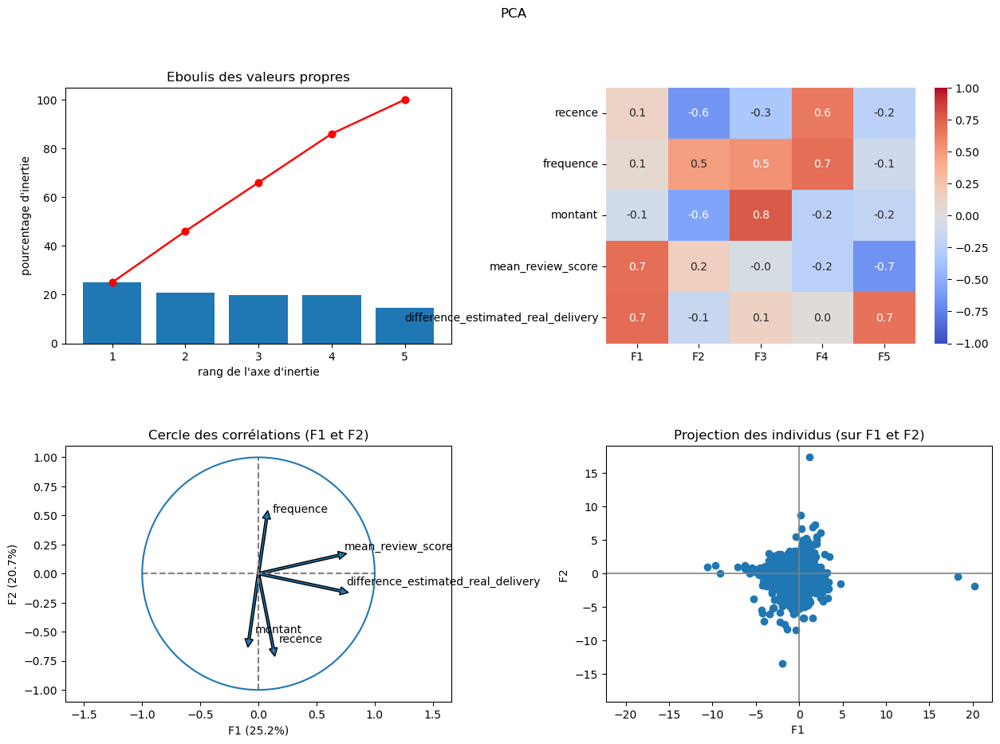

In [180]:
ACP(df_6)

Il y a encore un déséquilibre entre les features.

### t-SNE

In [181]:
t_SNE_6 = t_SNE(df_6)

### K Means

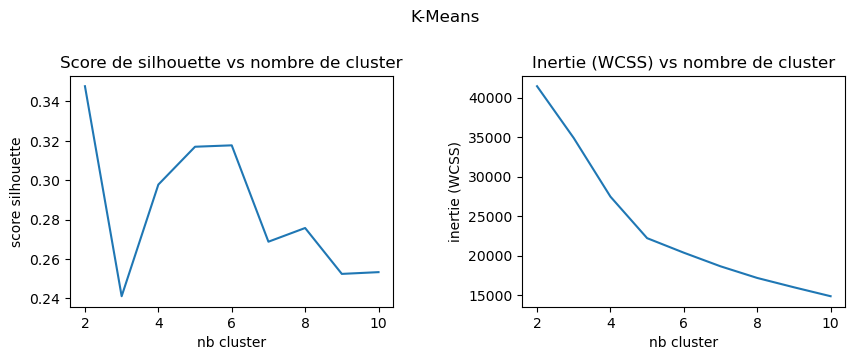

In [182]:
k_means_scoring(df_6)

On reste sur un coude à 5 clusters, la nouvelle feature n'apporte pas un groupe supplémentaire, et risque donc de mélanger la compréhension des clusters.

In [183]:
nb_individus_cluster(df_6,nb_cluster=5)

       recence
label         
0         4533
1          270
2         3456
3         1428
4          313
ARI score :  0.9670416559664928


In [184]:
labels_6 = label_cluster(df_RFM_RS_dist,nb_cluster=5)
t_SNE_graph(t_SNE_6,color=labels_6)

De la meme maniere que pour le délai de livraison, ici les frontières entre clusters ne sont pas très nettes.

### On va donc retenir le modèle Kmeans avec RFM et review score